<a href="https://colab.research.google.com/github/HannaKi/UTU_Deep_Learning_2020_task/blob/master/DL_task2_Hanna_Kitti.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project work for exam: Image classification with a modern CNN

Hanna Kitti

hanna.kitti@utu.fi

523087

7.7.2020

## Task: 

Choose a dataset (TF datasets or some of your own choice, NOT Keras datasets) and a model. Implement, train and document your work (use those textboxes) as a notebook and mail it to me. The better you follow the "general guidelines" the better your grade (you can skip some points but then your grade will be lower). Good work on some point compensates for less good work on some other point.

General guidelines

1. Build up an input pipeline. Here's a good guide.https://cs230.stanford.edu/blog/datapipeline/ Remember to split your data into training, validation and test sets. 

2. Implement preprocessing. Your model may work on images of a certain size, so crop and rescale if needed. Normalize your data either with your own code or with the preprocessing operation that comes with the model (see point 5).

3. Implement data augmentation. Use functions from Keras preprocessing https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image or TF image https://www.tensorflow.org/api_docs/python/tf/image  packages. You can also build your own transformations.

4. Both preprocessing and augmentation should become parts of your input pipeline.

5. Use a pretrained model from TF Hub https://tfhub.dev/ or Keras applications https://www.tensorflow.org/api_docs/python/tf/keras/applications(or some other, should you find one). Load only the convolutional base and build your own decision part on top of that (two layers + softmax).

6. Train and validate your model (select an optimizer). Plot loss and accuracy curves.

7. Fine-tune by opening a few layers (or layer blocks if it's easier) at a time. Train with a very small learning rate (might take a few tries to find a good starting value). Repeat until there's no improvement.

8. Try out the following (on the decision part you built): L2 regularization, dropout, Batch Normalization to see their effect on the test error.

9. Build a learning rate scheduler and make it a callback in training.

10. Save model checkpoint after each epoch to your Google drive. See TF guide and my guide under piazza Resources.

11. Try out TensorBoard https://www.tensorflow.org/tensorboard

12. Afterthought. What would you do differently next time?

# 0. Preparations 

In [1]:
import datetime
import math
import matplotlib.pyplot as plt
import numpy as np
import os # to use operating system dependent functionality
import pandas as pd
import seaborn as sns
import tensorflow.compat.v2 as tf # for pipeline and model
import tensorflow_datasets as tfds # for loading the data
import tensorflow_hub as hub

from google.colab import drive # to operate Google Drive folders
from keras.preprocessing import image
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler 

%matplotlib inline 
%load_ext tensorboard

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


Data used in this project is Tensorflow data "deep weeds". Data description from https://www.tensorflow.org/datasets/catalog/deep_weeds says that "The DeepWeeds dataset consists of 17,509 images capturing eight different weed species native to Australia in situ with neighbouring flora."

To keep the notebook neat some intermediate results and training progress printouts were excluded from this final version.

I load the data and inspect the info provided.

In [2]:
ds, info = tfds.load('deep_weeds', 
               split='train', 
               shuffle_files=True,
               as_supervised=True, # as_supervised: Returns a tuple (img, label) instead of dict {'image': img, 'label': label}
               with_info=True)

info

tfds.core.DatasetInfo(
    name='deep_weeds',
    version=2.0.0,
    description='The DeepWeeds dataset consists of 17,509 images capturing eight different weed species native to Australia in situ with neighbouring flora.The selected weed species are local to pastoral grasslands across the state of Queensland.The images were collected from weed infestations at the following sites across Queensland: "Black River", "Charters Towers",  "Cluden", "Douglas", "Hervey Range", "Kelso", "McKinlay" and "Paluma".',
    homepage='https://github.com/AlexOlsen/DeepWeeds',
    features=FeaturesDict({
        'image': Image(shape=(256, 256, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=9),
    }),
    total_num_examples=17509,
    splits={
        'train': 17509,
    },
    supervised_keys=('image', 'label'),
    citation="""@article{DeepWeeds2019,
      author = {Alex Olsen and
        Dmitry A. Konovalov and
        Bronson Philippa and
        Peter Ridd and

The images consist of 256*256 pixels and we have three color layers (RGB) as usual. We also find out that the data type of the images (dtype) is tf.uint8. This means 8-bit unsigned integer.

Data has one split, "train" (so basically no split at all) and we have to train, validate and test split it. Also tfds.load provides methods to split the train split while loading but since the split would be a share (for example first 10 percent) rather than a sample (every 10th item) I find it safer to load and suffle the data and split afterwards.

For splitting the data code from https://stackoverflow.com/questions/51125266/how-do-i-split-tensorflow-datasets?noredirect=1&lq=1 was utilized.

In [3]:
labels = info.features["label"].names
print(labels)
print("Number of classes: ", info.features["label"].num_classes)

['Chinee apple', 'Lantana', 'Parkinsonia', 'Parthenium', 'Prickly acacia', 'Rubber vine', 'Siam weed', 'Snake weed', 'Negative']
Number of classes:  9


The dataset info reveals we have truly 9 classes in the data (8 separate weeds + class "negative" to distinct). 

### 0.1 Handling imbalanced data

By looking at the class distribution of the data we can see notable imbalance. Since one of the classes is over represented in the data I decided to reject a share of instances belongin to that class. Tutorial from [Tensorflow guide](https://www.tensorflow.org/guide/data) was utilized for this purpose. 

The method chosen was to reject some of the data. Cutting down the size of the dataset is controversial. If the size of the dataset is big enough this can be done. Alternative way would be to give weight for each class (see the linked tutorial above). Also choosing the loss function properly helps to mitigate the imbalance problem, see [TF tutorial here](https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#oversample_the_minority_class).

In [4]:
# figure out the distribution of the classes in training data:

labels=[]
for feature, label in ds:
  labels.append(label.numpy())

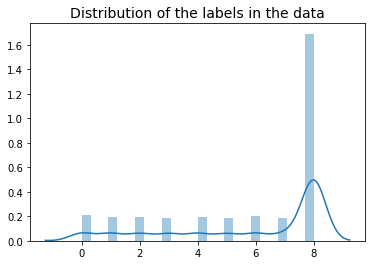

In [5]:
# plot the distribution
sns.distplot(labels)
plt.title("Distribution of the labels in the data", fontsize = 14)
plt.show()

In [5]:
shares = []
for i in np.unique(labels):
  count = labels.count(i)
  share = count/len(labels)
  shares.append(share)

shares

[0.06425267005540009,
 0.06076874750128505,
 0.05888400251299332,
 0.05836998115255012,
 0.060654520532297675,
 0.05762750585413216,
 0.061339882346221945,
 0.058027300245587984,
 0.5200753897995317]

In [6]:
share = 1/9 # I wish to have equal class distribution
dist = [share] * 9

def class_func(features, label):
  return label

resampler = tf.data.experimental.rejection_resample(
    class_func, target_dist=dist)

resample_ds = ds.apply(resampler)
balanced_ds = resample_ds.map(lambda extra_label, features_and_label: features_and_label)

Instructions for updating:
Use tf.print instead of tf.Print. Note that tf.print returns a no-output operator that directly prints the output. Outside of defuns or eager mode, this operator will not be executed unless it is directly specified in session.run or used as a control dependency for other operators. This is only a concern in graph mode. Below is an example of how to ensure tf.print executes in graph mode:



Instructions for updating:
Use tf.print instead of tf.Print. Note that tf.print returns a no-output operator that directly prints the output. Outside of defuns or eager mode, this operator will not be executed unless it is directly specified in session.run or used as a control dependency for other operators. This is only a concern in graph mode. Below is an example of how to ensure tf.print executes in graph mode:



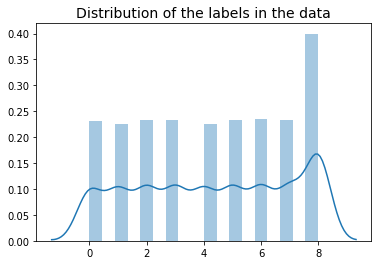

In [7]:
# Not good idea to loop through the data!

labels=[]
for feature, label in balanced_ds:
  labels.append(label.numpy())

# plot the distribution
sns.distplot(labels)
plt.title("Distribution of the labels in the data", fontsize = 14)
plt.show()

In [8]:
counts = []
shares = []
for i in np.unique(labels):
  count = labels.count(i)
  counts.append(count)
  share = count/len(labels)
  shares.append(share)

shares

[0.10270651503129684,
 0.10014987216785683,
 0.10341179582121132,
 0.10385259631490787,
 0.10041435246407476,
 0.10358811601868995,
 0.10473419730230098,
 0.10349995591995063,
 0.17764259895971082]

In [9]:
counts

[1165, 1136, 1173, 1178, 1139, 1175, 1188, 1174, 2015]

In [11]:
sum(counts)

11489

In [12]:
ds=balanced_ds

Let's take a look at some random samples:

Size of the image and number of color layers:  (256, 256, 3)
Label is a tensor:  tf.Tensor(8, shape=(), dtype=int64)


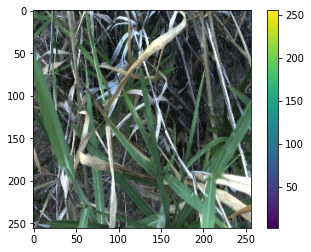

Size of the image and number of color layers:  (256, 256, 3)
Label is a tensor:  tf.Tensor(8, shape=(), dtype=int64)


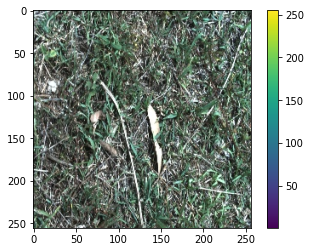

Size of the image and number of color layers:  (256, 256, 3)
Label is a tensor:  tf.Tensor(8, shape=(), dtype=int64)


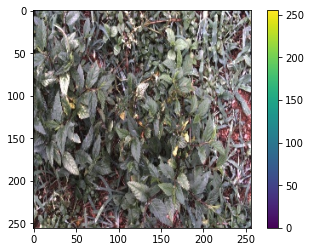

In [10]:
ds_ = ds.take(3)  # Only take random 3 examples

for example in ds_: 
  image = example[0]
  label = example[1]
  print("Size of the image and number of color layers: ", image.shape)
  print("Label is a tensor: ", label)
  plt.figure()
  plt.imshow(image)
  plt.colorbar()
  plt.grid(False)
  plt.show()

### 0.2 Train, validation and test splits

In [11]:
def is_validation(x, y):
    return x % 10 == 0   # 10 % of the given data (tuple) extracted

def is_train(x, y):
    return not is_validation(x, y)

recover = lambda x,y: y

In [23]:
ds_test = ds.enumerate().filter(is_validation).map(recover) # 10 % of all of the data for testing
ds_train = ds.enumerate().filter(is_train).map(recover) # 90 % is left here (remaining data)
ds_val = ds_train.enumerate().filter(is_validation).map(recover) # 10 % of the data remaining data for validating
ds_train = ds_train.enumerate().filter(is_train).map(recover) # what is left for training

In [ ]:
# Requesting the size of a tf data set in this manner is not a good practice! Goes through all the data and is slow.

ptest = len(list(ds_test))
ptrain = len(list(ds_train))
pval = len(list(ds_val))

print("Size of the data:")
print("All the data: ", ptest+pval+ptrain)
print("Training: ", ptrain)
print("Validation: ", pval)
print("Test: ", ptest)

#1. Data input pipeline with preprocessing and augmentation (tasks 1-4)


Input pipeline consists of simple reusable pieces and functions. The pipeline prepares data for the model. Here I will build an image pipeline.

First of all I define helper functions to prepare the image data. With the functions I 
 
1.   Resize the image and convert the image datatype form uint8 to float32. 
2.   MobileNets support any input size greater than 32 x 32, with larger image sizes offering better performance ([MobileNet overview](https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet_v2/preprocess_input)). So we can resize the images. Scaling down the model input layer saves RAM but also affects the model performance.
3.   Augment data.
4.   Use  [MobileNet "preprocess_input" function](https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet_v2/preprocess_input) wrapped in function dealing withe the labels also. With preprocess_input the inputs pixel values are scaled between -1 and 1, sample-wise.

Neural networks benefit of having more data with a lot of variation in it. This will help the model to generalize better, i.e. classifies correctly an image the model has not seen before. For this reason I will augment training data. 

For data augmentation I followed the procedures of [Stanford University](https://cs230.stanford.edu/blog/datapipeline/ ) and [Tensorflow documentation](https://www.tensorflow.org/api_docs/python/tf/image/). Augmentation should perform classification-invariant transformations. With the deep weeds data, where the images are taken above the plants growing on the ground, we can flip the image upside down or from left to right and do no harm but this is not always the case. I use random augmentation which means that each of the transformations is applied by a 50 % chance.

In [24]:
IMAGE_SIZE = 128 # parameter value which can be altered. Bigger size makes training slow and consumes RAM availabe in Colab.

def resize_img(image, label):
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE)) # Resize images
  image = tf.cast(image, tf.float32) # Change data type: `uint8` -> `float32`
  return image, label

def augmentation(image, label):
  # flip image
  image = tf.image.random_flip_left_right(image) 
  image = tf.image.random_flip_up_down(image)
  # adjust colours, saturation etc.
  image = tf.image.random_hue(image, 0.08)
  image = tf.image.random_saturation(image, 0.6, 1.6)
  image = tf.image.random_brightness(image, 0.05)
  image = tf.image.random_contrast(image, 0.7, 1.3)
  return image, label

# preprocess_input is MobileNet preprocessing function. 
def mobilenet_preprocess(image, label): 
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  return image, label

def one_hot(image, label):
  label = tf.one_hot(label, 9) #, on_value=1, off_value=0
  return image, label


## 1.1 Training data pipeline

Code and order of pipeline elements are adapted from Tensorflow tutorials [1](https://www.tensorflow.org/datasets/performances) and [2](https://www.tensorflow.org/datasets/keras_example) and  [Stanford University tutorial](https://cs230.stanford.edu/blog/datapipeline/#best-practices).

The dataset has been shuffled when it was imported, but here I shuffle it again. Basically shuffling once should be enough, but I repeat it here just to be safe. Shuffling is important since many data sets are arranged in a way where successive examples are highly correlated (example a time series from one patient). Using ordered data would lead the model to learn perhaps nothing more than the order of the data. While large buffer_size shuffles more thoroughly (size of the data set is recommended), it takes a lot of memory. Here I settle for buffer_size 1000.

Since model weights are updated after each batch batch size is truly a hyperparameter for the model and should be optimized. According to the [Deep Learning book](https://http://www.deeplearningbook.org) small batch size leads to better generalization. "Training with such a small batch size might require a small learning rate to maintain stability because of the high variance in the estimate of the gradient. The total runtime can be very high as a result of the need to make more steps, both because of the reduced learning rate and because it takes more steps to observe the entire training set."

Parallelizing (num_parallel_calls) makes processing faster. I do not specify the number of cords, it will be selected automatically.


In [25]:
# Large batch size is heavy for memory, small helps to generalize but runtime is longer.
# For imbalanced data we should ensure that each batch has some instances from all the classes. 
# This is most easily done by increasing the batch size

BATCH_SIZE = 128# 32

ds_train = ds_train.shuffle(1000) 
ds_train = ds_train.map(resize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.cache()
ds_train = ds_train.batch(BATCH_SIZE)  
ds_train = ds_train.map(augmentation, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.map(one_hot, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.map(mobilenet_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE) # MobileNet preprocessing
ds_train = ds_train.prefetch(tf.data.experimental.AUTOTUNE) # Prefetch one batch to make sure that a batch is ready to be served at all time

print(ds_train.element_spec)

(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.float32, name=None))


Just take a fast glimpse at the data here. Note that matplotlib cuts the data to [0, 1] from [-1, 1] which alters the plotted images below.

Size of the image and number of color layers:  (128, 128, 3)
Label is a tensor:  tf.Tensor([0. 0. 0. 1. 0. 0. 0. 0. 0.], shape=(9,), dtype=float32)


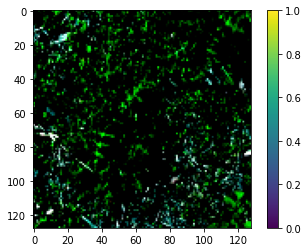

Size of the image and number of color layers:  (128, 128, 3)
Label is a tensor:  tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 1.], shape=(9,), dtype=float32)


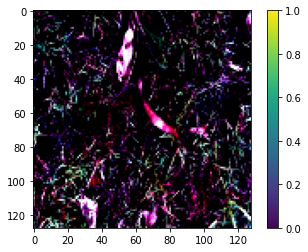

Size of the image and number of color layers:  (128, 128, 3)
Label is a tensor:  tf.Tensor([0. 0. 0. 0. 0. 0. 1. 0. 0.], shape=(9,), dtype=float32)


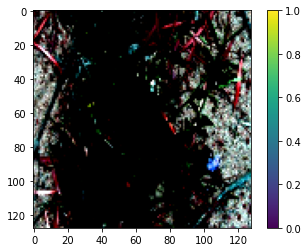

In [26]:
ds_ = ds_train.take(1)  # Now we index a bit differently from previous and only take one batch
for example in ds_:  
  for i in range(3):  # From the batch we look at 3 examples to see the results of the image manipulation
    image = example[0][i] 
    label = example[1][i]
    print("Size of the image and number of color layers: ", image.shape)
    print("Label is a tensor: ", label)
    plt.figure()
    plt.imshow(image)
    plt.colorbar()
    plt.grid(False)
    plt.show()

## 1.2 Validation and test pipeline

Validation and test data pipelines are similar to the training pipeline.

In [27]:
ds_val = ds_val.map(resize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_val = ds_val.map(mobilenet_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE) # MobileNet preprocessing
ds_val = ds_val.batch(BATCH_SIZE)
ds_val = ds_val.map(one_hot, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_val = ds_val.prefetch(tf.data.experimental.AUTOTUNE)

print("Validation data: ", ds_val.element_spec)



Validation data:  (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.float32, name=None))


In [28]:
ds_test = ds_test.map(resize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_test = ds_test.map(mobilenet_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE) # MobileNet preprocessing
ds_test = ds_test.batch(BATCH_SIZE)
ds_test = ds_test.map(one_hot, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_test = ds_test.prefetch(tf.data.experimental.AUTOTUNE)

print("Test data: ", ds_test.element_spec)

Test data:  (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.float32, name=None))


Now all the data (training, validation and test) are in a suitable format for the model. 

## 1.3 Naive baseline

Let's make a really naive baseline for the upcoming CNN classifiers. I could build a linear baseline classifier but I do not want to do laborious feature extraction from the images just for the baseline classifier. So the baseline will be simply guessing the most common class in the training data. 

# Uudella datasetillä isoimman luokan tn on 17 %

In [ ]:
# # figure out the distriution of the classes in training data:

# num_of_batches=math.ceil(ptrain/BATCH_SIZE)

# label_arrays=[]
# for feature_batch, label_batch in ds_train: # take all the batches
#   label_arrays.append(label_batch.numpy())

# labs = []
# for array in label_arrays:
#     for item in array:
#         labs.append(item)

# assert len(labs) == ptrain

# # plot the distribution
# sns.distplot(labels)
# plt.title("Distribution of the labels in the data", fontsize = 14)
# plt.show()

In [ ]:
# unique, counts = np.unique(labels, return_counts=True)
# probs = counts/ptrain
# probs = dict(zip(unique, probs*100))
# probs

We can see, that the distribution of the labels is not uniform and that there is more than 50 % chance that a randomly selected image in the training data belongs to class 8. (In a separate experiment this inbalance was found to be true with the original dataset as well as with the validation and test datasets)

So the naive baseline is to guess that a new image belongs to class 8 and the probability to succeed with this guess is approximately 50 percent. Any classifier built later on should outperform this guess to be any good.

# 2. Building the model by using a pretrained model (tasks 5, 6 and 10)

The model chosen here is a convolutional neural network called MobileNet. The network is trained with Imagenet data but I will retrain it with the deep weeds data. This model will serve as a convolutional base and I will build my own decision part on top of that. 

The decision part will consist of two fully connected dense layers. For the hidden layer I use relu and for the output layer softmax as a decision function. [Tensorflow tutorial](https://www.tensorflow.org/tutorials/images/transfer_learning) was applied for building the model.

For selecting the size of the hidden layer I followed the guideline stated in Deep Learning course material: "A larger model converges faster than a smaller one". This means a larger model need less epochs to reach the same training loss as a smaller one. Also some trial and error was needed to select the hidden layer size below. If the model is too big (has too much capacity) it overfits and learns by heart the training data. This is not desirable since this kind of a model does not generalize well on new data. 

The size of the hidden layer is a hyperparameter for the model. I could systematically optimize it and all the other upcoming hyperparameters, but this is computationally expensive the more hyperparameters we have. 

The size of the output layer is the same as the number of the classes, 9.

In [42]:
# Let's set up some parameters
# Define input shape
IMAGE_SHAPE = (IMAGE_SIZE, IMAGE_SIZE, 3)
# Number of epochs
EPOCHS = 10
# Metrics to follow while training
METRICS = [
      tf.keras.metrics.TruePositives(name='tp'),
      tf.keras.metrics.FalsePositives(name='fp'),
      tf.keras.metrics.TrueNegatives(name='tn'),
      tf.keras.metrics.FalseNegatives(name='fn'), 
      tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc')
]

In [30]:
base_model = tf.keras.applications.MobileNetV2(input_shape=IMAGE_SHAPE,
                                               include_top=False, # decision part is not loaded
                                               weights='imagenet') # weigts are loaded
                                               
base_model.trainable = True # also the convolutional base model will be trained

By creating an instance of the model with and without the decision part (include_top=True/False) I found out the architecture of the decisive part. Observations are below:

```
# Last layer of the base model when top NOT included: 
# Layer (type)                    Output Shape         Param #     Connected to (previous layer)
# out_relu (ReLU)                 (None, 4, 4, 1280)   0           Conv_1_bn[0][0] 

# Layers added to previous when top included:
# Layer (type)                    Output Shape         Param #     Connected to (previous layer)
# global_average_pooling2d (Globa (None, 1280)         0           out_relu[0][0]                   
# predictions (Dense)             (None, 1000)         1281000     global_average_pooling2d[0][0]
```

So beside of the required dense layers I do need a GlobalAveragePooling2D layer.

Let's look at the input and the output of the base model.

In [31]:
base_out = base_model.outputs[0]

print(base_model.inputs) # input of the model: batch, size of the image and number of layers
print(base_out) # output without a decision part

[<tf.Tensor 'input_1:0' shape=(None, 128, 128, 3) dtype=float32>]
Tensor("out_relu/Identity:0", shape=(None, 4, 4, 1280), dtype=float32)


The shape of the input is the same as the image size. Output shape needs to be tuned and next I will build the decision part on top (or bottom) of the base model:

In [178]:
LAYER_SIZE = 512 # Model hyperparameter

#global_average_pooling2d needed here
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
pooling=global_average_layer(base_out) # output of the base model is the input of the pooling layer, etc.

# one hidden dense layer
dense=Dense(LAYER_SIZE, activation='relu')(pooling)

# output layer: by calling the output layer we end up calling all the other layers (the base model)
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(dense) # multiclass problem --> softmax

# function to define the model
def create_model():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out]
    )
  return model

In [176]:
model=create_model()

By looking at the model summary below we find out, that the model consists of 16 layer blocks plus input and output layers. The shape of the input image (pixel * pixel) gets smaller as it proceeds through the network but the number of features extracted grows to 1280.

At the bottom of the model are the two added dense layers which are the decision part of the model. The model is now able to predict nine classes as intented.

In [ ]:
model.summary()

In [179]:
# since classes are one-hot-encoded (vs. integers ) I use categorical crossentropy loss instead of sparce categorical crossentropy loss

model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=6.1e-05), # default learning rate 0.001
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

## 2.1 Training and saving Model Checkpoints

Before training the model I am creating model checkpoints so I am able to restore the results of the training in case of Colab crashes or the connection fails. (So milestone 10. of the original exercise was carried out here.)

In [28]:
# To connect Google account to Colab
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [29]:
# "!" marks operating system commands

# Create a folder for the model checkpoints if it does not exist:
# cp_directory = "/content/gdrive/My Drive/checkpoints/"
#!mkdir '{cp_directory}' #if needed


In [30]:
# to list the contents of the Google Drive:
# !pwd
# !ls -l '/content/gdrive/My Drive/checkpoints'

Default is to save after every epoch and this is what I want to do. For details look at: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

In [48]:
# this is the file path to the folder where checkpoints will be saved.
# filename "cp-{epoch:04d}.hdf5" will save each checkpoint with the number of the epoch.
file_path="/content/gdrive/My Drive/checkpoints/baseline_cp-{epoch:04d}.hdf5"

mc_cb = ModelCheckpoint(filepath=file_path, 
                        monitor='val_loss', 
                        verbose=1, 
                        save_best_only=False, # save all (do not overwrite)
                        save_weights_only=True, # only the weights are saved. To use them a model is needed but it can be saved elsewhere or restored from this notebook
                        save_freq='epoch', # save after every epoch
                        mode='auto')

history = model.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb])

Epoch 1/10
    111/Unknown - 38s 339ms/step - loss: 0.6696 - tp: 17884.0000 - fp: 2369.0000 - tn: 170479.0000 - fn: 3722.0000 - accuracy: 0.8546 - precision: 0.8830 - recall: 0.8277 - auc: 0.9814
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/baseline_cp-0001.hdf5
111/111 [==============================] - 54s 487ms/step - loss: 0.6696 - tp: 17884.0000 - fp: 2369.0000 - tn: 170479.0000 - fn: 3722.0000 - accuracy: 0.8546 - precision: 0.8830 - recall: 0.8277 - auc: 0.9814 - val_loss: 11.0332 - val_tp: 354.0000 - val_fp: 1096.0000 - val_tn: 11512.0000 - val_fn: 1222.0000 - val_accuracy: 0.2418 - val_precision: 0.2441 - val_recall: 0.2246 - val_auc: 0.5965
Epoch 2/10
111/111 [==============================] - ETA: 0s - loss: 0.3673 - tp: 12206.0000 - fp: 1388.0000 - tn: 112068.0000 - fn: 1976.0000 - accuracy: 0.8785 - precision: 0.8979 - recall: 0.8607 - auc: 0.9890
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/baseline_cp-0002.hdf5
111/111 [=========

Restoring from memory:
1. Create model
2. Compile it
3. Load saved weights

In [28]:
# model.load_weights('/content/gdrive/My Drive/checkpoints/baseline_cp-0010.hdf5')

### 2.1.1 Model performance

In [107]:
def plot_metrics(history):
  metrics =  ['loss', 'auc', 'precision', 'recall']
  for n, metric in enumerate(metrics):
    name = metric.replace("_"," ").capitalize()
    #plt.subplot(2,2,n+1)
    plt.plot(figsize=(6,6))
    plt.plot(history.epoch, history.history[metric],label='Train')
    plt.plot(history.epoch, history.history['val_'+metric],
              linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.legend()
    plt.ylabel(name)
    plt.show()

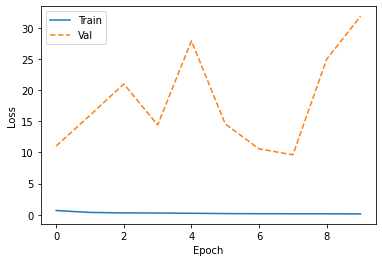

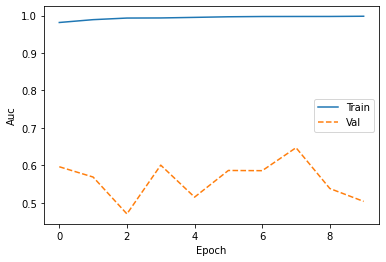

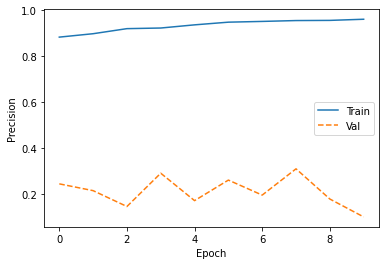

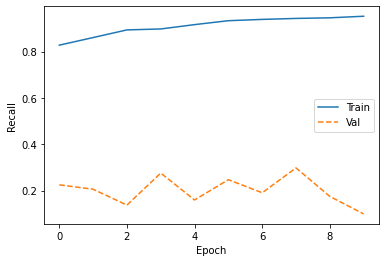

In [108]:
plot_metrics(history)

In [135]:
results = model.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 30.82587432861328 
True Positive: 195.0 
False Positive: 1539.0 
True Negative: 12469.0 
False Negative: 1556.0 
Accuracy: 0.11250714212656021 
Precision: 0.11245674639940262 
Recall: 0.1113649308681488 
AUC: 0.5132920145988464


In [53]:
# Code adapted from University of Turku Deep Learning course material

# def plot_acc(history):
#     plt.plot(history.history['accuracy'], label="Training set accuracy")
#     plt.plot(history.history['val_accuracy'], label="Validation set accuracy")
#     plt.title("Accuracies", fontsize = 14)
#     plt.legend()
#     plt.show()

# def plot_loss(history):
#     plt.plot(history.history['loss'], label="Training set loss")
#     plt.plot(history.history['val_loss'], label="Validation set loss")
#     plt.title("Losses", fontsize = 14)
#     plt.legend()
#     plt.show()

In [ ]:
# plot_acc(history)
# plot_loss(history)

# KORJAA 

Through the training process the training loss is smaller than the validation loss, which means the model is overfitting. This leads to not so good performance with 77 percent test accuracy and test loss of 1.4. The model outperforms the naive baseline but it could be improved.

In [152]:
baseline_model_loss = np.copy(history.history['val_loss'])
baseline_model_auc = np.copy(history.history['val_auc'])

### 2.1.2 Confusion Matrix

Confusion matrix shows how well the model predicts each of the classes by comparing the numbers of true and predicted labels.

In [136]:
# predicted labels of the test data

predictions = model.predict(ds_test)

preds = []
for i in range(len(predictions)):
   prediction = np.argmax(predictions[i])
   preds.append(prediction)

In [124]:
# true labels of the test data 

label_arrays=[]
for feature, label in ds_test:
  label_arrays.append(label.numpy())

labels = []
for array in label_arrays:
    for item in array:
        labels.append(item)

true_labels = []
for i in range(len(labels)):
   la = np.argmax(labels[i])
   true_labels.append(la)

In [137]:
# The matrix columns represent the prediction labels and the rows represent the real labels

cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

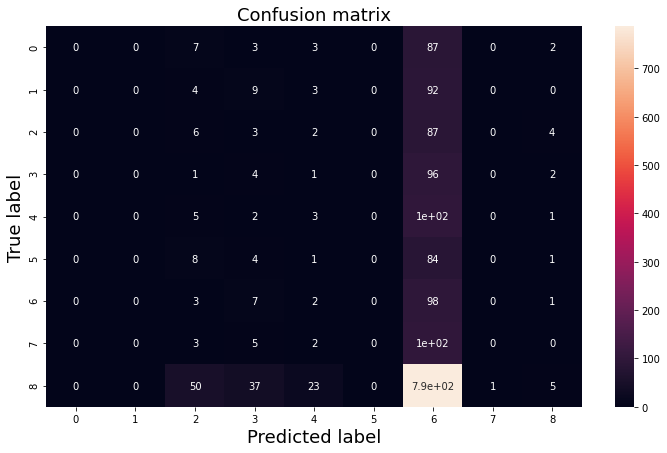

In [138]:
def plot_cf_matrix(cf_mat):
  plt.figure(figsize = (12,7))
  plt.title("Confusion matrix", fontsize = 18)
  sns.heatmap(cf_mat, annot = True)
  plt.ylabel("True label", fontsize = 18)
  plt.xlabel("Predicted label", fontsize = 18)
  plt.show()

plot_cf_matrix(cf_mat)

On the diagonal of the confusion matrix we have the number of successful predictions for each class.

As observed before, class 8 is big in the data. From the confusion matrix above we can see, that the model tends to predict classes two, three and eight. Most of the model succes is based on predicting class 8 correctly. 

Since we only look at the loss and accuracy at the time of the training and do not punish for miss classified cases, reached accuracy is an optimistic measure for the performance.

Anyhow, this far the model does not outperform our naive baseline in terms of accuracy.

# 3. Visualizing layers and training with a very small learning rate (task 7)

## 3.1 Visualizing layer activations without optimized learning rate

According to [Stanford university Convolutional Neural Networks for Visual Recognition course webpage](/https://cs231n.github.io/understanding-cnn/) visualising layer activations is the most efficient way to find out what and how a convolutional network learns. 

During the training some filters might end up dead, which means there is no forward signal from the unit. Dead units are a symptom of a too high learning rate. 

Next I will visualize some relu activations of the constructed MobileNet model. The code for the visualization was adapted from [Gabriel Pierobon's towards data science blog post](https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0) and the respective [GitHub page](https://github.com/gabrielpierobon/cnnshapes/blob/master/README.md).

model.summary() gives the names of each layer. I select some layers from different blocks.

In [ ]:
model.summary()

In [141]:
                                            # output shape (x by x) and number of layers (features)

layer_names = ['block_1_expand_relu',       # 64, 64, 96 
               'block_4_expand_relu'  ,     # 16, 16, 192
               'block_6_expand_relu',       # 16, 16, 192
               'block_8_depthwise',         # 8, 8, 384
               'block_11_expand_relu',      # 8, 8, 576
               'block_12_depthwise_relu',   # 8, 8, 576
               'block_15_depthwise',        # 4, 4, 960
               'block_16_depthwise_relu'    # 4, 4, 960
]

layer_outputs = [model.get_layer(name).output for name in layer_names]

In [142]:
# Create a model that will return layer outputs, given the model input
activation_model = Model(inputs=model.input, outputs=layer_outputs) 

# now we have a model with one input and multiple outputs
print("Number of inputs: ",len(activation_model.inputs))
print("Number of outputs: ", len(activation_model.outputs))

Number of inputs:  1
Number of outputs:  8


Next I select an unseen image (image not seen during training) from test data. This image will be used for visualizing the activations.

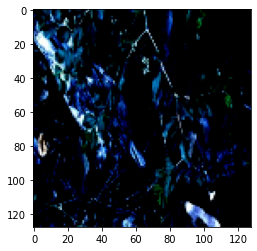

In [143]:
ds_ = ds_test.take(1) 

for element in ds_.as_numpy_iterator():
  image = element[0][0] 
  label = element[1][0]

input_image = np.expand_dims(image, axis=0)
plt.imshow(image)
plt.show()

Next I instantiate a model from the input image and the list of output layers

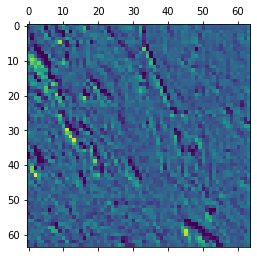

In [144]:
# gather activations of each layer to a list
activations = activation_model.predict(input_image) 

first_layer_activation = activations[0]

# This is what the model sees on the first listed layer on the 4th channel
plt.matshow(first_layer_activation[0, :, :, 3])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


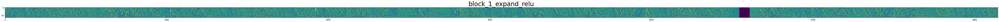

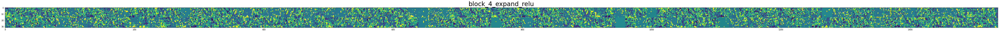

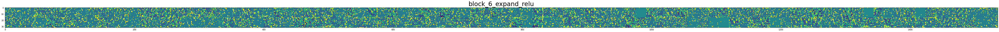

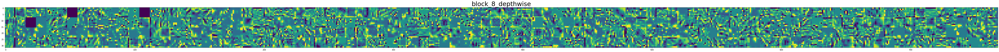

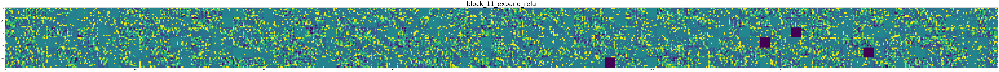

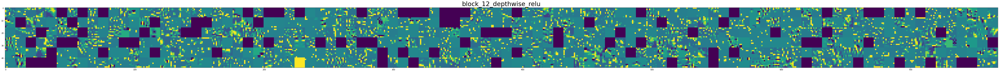

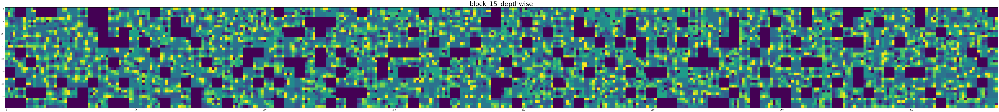

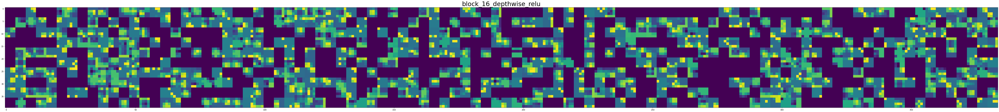

In [145]:
# code from: https://github.com/gabrielpierobon/cnnshapes/blob/master/README.md
def viz_layer_activations(activations):
  activations=activations

  images_per_row = 96

  for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
      n_features = layer_activation.shape[-1] # Number of features in the feature map
      size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
      n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
      display_grid = np.zeros((size * n_cols, images_per_row * size))
      for col in range(n_cols): # Tiles each filter into a big horizontal grid
          for row in range(images_per_row):
              channel_image = layer_activation[0,
                                              :, :,
                                              col * images_per_row + row]
              channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size, # Displays the grid
                          row * size : (row + 1) * size] = channel_image
      scale = 1. / size
      plt.figure(figsize=(scale * display_grid.shape[1],
                          scale * display_grid.shape[0]))
      plt.title(layer_name, fontsize=34)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='viridis')

viz_layer_activations(activations=activations)

In the image matrices above dead units are the dark blue squares. In an optimally functional model we would have them as little as possible.

## 3.2 Finding the optimal learning rate

Learning rate has been said to be the most important parameter to optimize in a neural network. To find an optimal learning rate (keeping all the rest of the parameters constant) I set a grid for learning rates to be tested:

In [146]:
l_rates = np.logspace(-16, -8, num = 5, base = 2).tolist()

l_rates

[1.52587890625e-05, 6.103515625e-05, 0.000244140625, 0.0009765625, 0.00390625]

So I will test 5 differet learning rates. Their performence is compared with resulting test accuracy. Also validation loss and accuracy after each epoch are important metrics. To experiment learning rates faster I run just 10 epochs for each rate.

In [147]:
p1="/content/gdrive/My Drive/checkpoints/search_1_cp-{epoch:04d}.hdf5"
p2="/content/gdrive/My Drive/checkpoints/search_2_cp-{epoch:04d}.hdf5"
p3="/content/gdrive/My Drive/checkpoints/search_3_cp-{epoch:04d}.hdf5"
p4="/content/gdrive/My Drive/checkpoints/search_4_cp-{epoch:04d}.hdf5"
p5="/content/gdrive/My Drive/checkpoints/search_5_cp-{epoch:04d}.hdf5"

file_paths = [p1, p2, p3, p4, p5]

In [153]:
def complile_and_train(learning_rate=0.001, file_path='pathx'):
  model.compile(
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate), 
    loss=tf.keras.losses.CategoricalCrossentropy(), 
    metrics=METRICS)
  
  mc_cb = ModelCheckpoint(filepath=file_path, 
                        monitor='val_loss', 
                        verbose=1, 
                        save_best_only=False, # save all (do not overwrite)
                        save_weights_only=True, # only the weights are saved. To use them a model is needed but it can be saved elsewhere or restored from this notebook
                        save_freq='epoch', # save after every epoch
                        mode='auto')

  model.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb]) 
  
  results = model.evaluate(ds_test, verbose = 1)
  test_auc = results[8]

  return test_auc

In [154]:
# iterate over the two variable lists and fit the model:
EPOCHS = 10

result = {}
for lr, path in zip(l_rates, file_paths):
  print("Training with learning rate:", lr)
  auc = complile_and_train(learning_rate=lr, file_path=path)
  result[lr] = auc

Training with learning rate: 1.52587890625e-05
Epoch 1/10
    111/Unknown - 37s 338ms/step - loss: 0.0825 - tp: 14037.0000 - fp: 1911.0000 - tn: 126577.0000 - fn: 2024.0000 - accuracy: 0.8770 - precision: 0.8802 - recall: 0.8740 - auc: 0.9471
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/search_1_cp-0001.hdf5
111/111 [==============================] - 54s 486ms/step - loss: 0.0825 - tp: 14037.0000 - fp: 1911.0000 - tn: 126577.0000 - fn: 2024.0000 - accuracy: 0.8770 - precision: 0.8802 - recall: 0.8740 - auc: 0.9471 - val_loss: 21.1801 - val_tp: 350.0000 - val_fp: 1201.0000 - val_tn: 11407.0000 - val_fn: 1226.0000 - val_accuracy: 0.2234 - val_precision: 0.2257 - val_recall: 0.2221 - val_auc: 0.5730
Epoch 2/10
111/111 [==============================] - ETA: 0s - loss: 0.0569 - tp: 13892.0000 - fp: 226.0000 - tn: 113230.0000 - fn: 290.0000 - accuracy: 0.9820 - precision: 0.9840 - recall: 0.9796 - auc: 0.9996
Epoch 00002: saving model to /content/gdrive/My Drive/checkpo

In [155]:
for x in result:
  print("learning rate: ", x, "--> test AUC: ",result[x]) 

learning rate:  1.52587890625e-05 --> test AUC:  0.9802346229553223
learning rate:  6.103515625e-05 --> test AUC:  0.9983342289924622
learning rate:  0.000244140625 --> test AUC:  0.9911057949066162
learning rate:  0.0009765625 --> test AUC:  0.8121793270111084
learning rate:  0.00390625 --> test AUC:  0.6520775556564331


The best learning rate on the basis of the AUC on the test data is on top of the sorted results:

In [156]:
sorted_result = sorted(result.items(), key=lambda x: x[1], reverse=True)
print("Best learning rate: ", sorted_result[0][0])
print("Test AUC of the learning rate:", sorted_result[0][1])

Best learning rate:  6.103515625e-05
Test AUC of the learning rate: 0.9983342289924622


In [157]:
LEARNING_RATE = sorted_result[0][0]

In [38]:
#LEARNING_RATE = 6.103515625e-05

In [35]:
#file_path="/content/gdrive/My Drive/checkpoints/lr_cp-{epoch:04d}.hdf5"

In [ ]:
# EPOCHS = 10

# model_lr=create_model()

# model_lr.compile(
#   optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), # grid searched learning rate used here
#   loss='sparse_categorical_crossentropy',
#   metrics=['sparse_categorical_accuracy'])

# mc_cb = ModelCheckpoint(filepath=file_path, 
#                         monitor='val_sparse_categorical_accuracy', 
#                         verbose=1, 
#                         save_best_only=False, # save all (do not overwrite)
#                         save_weights_only=True, # only the weights are saved. To use them a model is needed but it can be saved elsewhere or in notebook
#                         save_freq='epoch', # save after every epoch
#                         mode='auto')

# history = model_lr.fit(
#     ds_train,
#     verbose=1,
#     epochs=EPOCHS, 
#     validation_data = ds_val,
#     callbacks=[mc_cb])

### 3.2.1 Model performance

In [165]:
model_lr=create_model()

model_lr.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), 
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

model_lr.load_weights('/content/gdrive/My Drive/checkpoints/search_2_cp-0010.hdf5')

In [166]:
results = model_lr.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 0.05161907523870468 
True Positive: 3439.0 
False Positive: 62.0 
True Negative: 27954.0 
False Negative: 63.0 
Accuracy: 0.9822958111763 
Precision: 0.9822907447814941 
Recall: 0.9820103049278259 
AUC: 0.9979660511016846


In [ ]:
# plot_acc(history)
# plot_loss(history)

# results = model_lr.evaluate(ds_test, verbose = 0)
# print('test loss:', results[0], '\ntest acc:', results[1])

With the optimized learning rate the test accuracy and loss improved significantly. Training and validation losses are rather close to each other after a couple of ephocs. 

### 3.2.2 Confusion Matrix

In [ ]:
predictions = model_lr.predict(ds_test)

preds = []
for i in range(len(predictions)):
   prediction = np.argmax(predictions[i])
   preds.append(prediction)

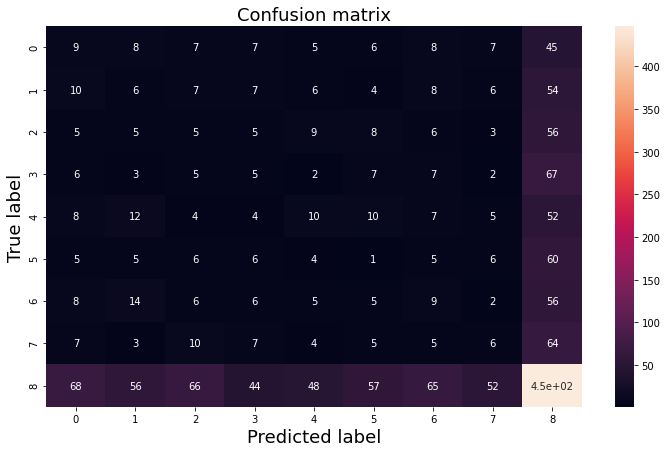

In [168]:
# predicted labels of the test data

predictions = model_lr.predict(ds_test)

preds = []
for i in range(len(predictions)):
   prediction = np.argmax(predictions[i])
   preds.append(prediction)

# The matrix columns represent the prediction labels and the rows represent the real labels

cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

As stated, model accuracy is significantly better than it was without the learning rate optimization. From the confusion matrix above and by comparing it to the one in section 2.3.2 we can see that much of the improvement comes from model's ability to predict class 8 correctly

In [186]:
print(true_labels[:20])
preds[:20]

[4, 1, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 0, 7, 8, 8, 3, 6, 1, 8]


[8, 8, 1, 4, 8, 8, 0, 0, 3, 2, 8, 6, 8, 8, 8, 3, 8, 8, 8, 8]

### 3.2.3 Model comparison

In [38]:
# opt_lr_model_loss = np.copy(history.history['val_loss'])
# opt_lr_model_acc = np.copy(history.history['val_sparse_categorical_accuracy'])

In [39]:
# # Code from UTU Deep Learning course
# def plot_losses(loss1, loss2, label1, label2):
#     epochs = range(1, len(loss1) + 1)
#     plt.plot(epochs, loss1, label=label1)
#     plt.plot(epochs, loss2, label=label2)
#     plt.title('Validation loss')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.show()

# def plot_accuracies(acc1, acc2, label1, label2):
#     epochs = range(1, len(acc1) + 1)
#     plt.plot(epochs, acc1, label=label1)
#     plt.plot(epochs, acc2, label=label2)
#     plt.title('Validation accuracy')
#     plt.xlabel('Epochs')
#     plt.ylabel('Accuracy')
#     plt.legend()
#     plt.show()

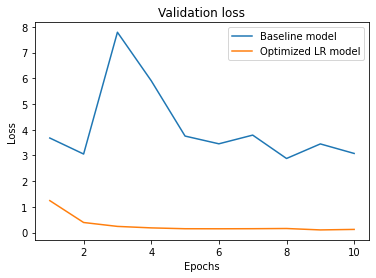

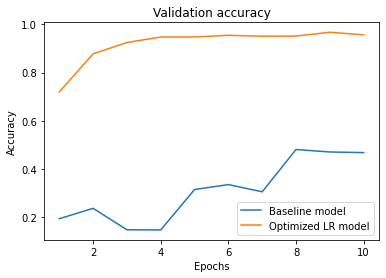

In [40]:
# plot_losses(baseline_model_loss, opt_lr_model_loss, 'Baseline model', 'Optimized LR model')
# plot_accuracies(baseline_model_acc, opt_lr_model_acc, 'Baseline model', 'Optimized LR model')

With optimized learning rate the model has better validation accuracy and loss. Training is also smoother, the metrics do not jump or zig zag. Optimized model seems to improve rather little during the last 5 epochs so we could do with less also.

In [92]:
# Calling from checkpoint if needed
# model_2=create_model()

# model_2.compile(
#   optimizer=tf.keras.optimizers.Adam(), 
#   loss='sparse_categorical_crossentropy',
#   metrics=['sparse_categorical_accuracy'])

# model.load_weights('/content/gdrive/My Drive/checkpoints/lr_cp-0010.hdf5')

In [ ]:
# loss,acc = model_2.evaluate(ds_test)

## 3.4 Visualizing layer activations with optimized learning rate

In [169]:
# let's repeat the steps for visualizing the layer activatons with the new improved learning rate:
layer_outputs_lr = [model_lr.get_layer(name).output for name in layer_names]
activation_model_lr = Model(inputs=model_lr.input, outputs=layer_outputs_lr) 
activations_lr = activation_model_lr.predict(input_image)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


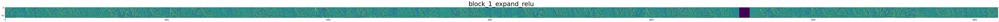

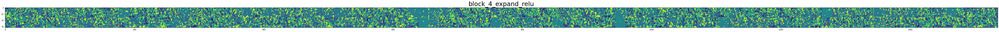

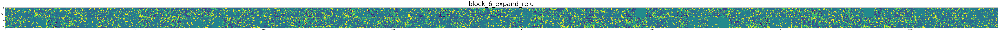

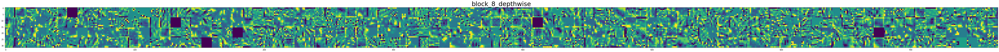

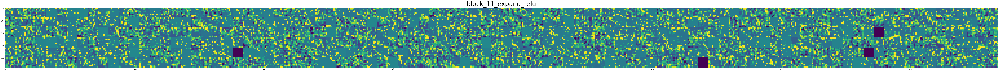

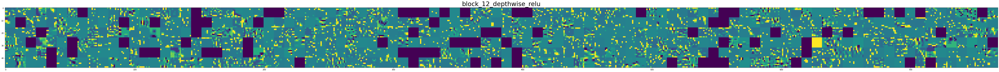

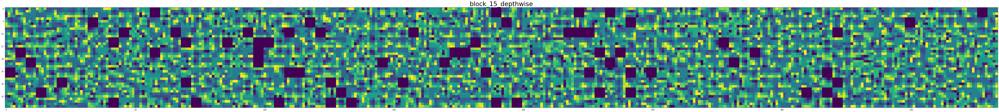

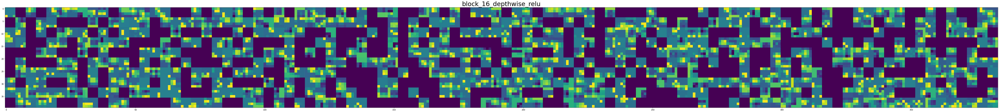

In [170]:
viz_layer_activations(activations=activations_lr)

Visual inspection of the two activation visualizations (default learning rate and optimized learning rate) is rather difficult. 

block_16_depthwise_relu seems to have more dead units in the model trained with smaller learning rate. block_12_depthwise_relu is the other way around. 

Anyhow, smaller learning rate produces more accurate results and smaller loss.

# 4. Regularizing the model (task 8)

By regularizing a model we aim to avoid overfitting. Overfitting means the model learns the noise in the training data and generalizes poorly. Regularization consists of strategies explicitly designed to reduce the test error, possibly at the expense of increased training error.  According to the Deep Learning book typically "the best ﬁtting model (in the sense of minimizing generalization error) is a large model that has been regularized appropriately". 

With all the regularizers I use the optimized learning rate and compare to the results gaided with the optimized learning rate model.

## 4.0 Early stopping

Early Stopping is most commonly used form of regularization in deep learning. Early Stopping means the number of epochs is treated as a hyperparameter. Hence we are controlling the effective capacity of the model. After defined number of ephocs the training stops if the selected metrics (here validation accuracy) are not improving.

In [ ]:
m=create_model()

model.compile(
  optimizer=tf.keras.optimizers.Adam(lr=learning_rate), 
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

stop_cb = EarlyStopping(monitor = 'val_loss', 
                        patience=3, # how many epochs to wait for the metrics to improve
                        verbose=1, 
                        mode='auto', 
                        baseline=None, 
                        restore_best_weights=True)

hist = m.fit(
    ds_train,
    verbose=1,
    epochs=15,
    validation_data = ds_val,
    callbacks=[stop_cb])

Since Early Stopping is added to the task just for demonstration, the parameter "patience" was set to rather low value, 3 epochs. 

## 4.1 L2 regularization

L2 regularization (a.k.a. weight decay, ridge regression) penalizes model for being too complex. The regularization penalty multiplied by weight is added to the total loss of the network. Hence we are punishing for higher weights and  expect that none of the model parameters is drastically more important than the other ones.

[Tensorflow tutorial](https://www.tensorflow.org/tutorials/keras/overfit_and_underfit#add_weight_regularization) gives the exact definition of the regularizer: "l2(0.001) means every coefficient in the weight matrix of the layer will add 0.001 * weight_coefficient_value squared to the total loss of the network.". This multiplier is one more hyperparameter I do not systematically optimize.

The penalty is only added at training time. Hence the loss (for this network) will be much higher at training than at validation and test time.

In [171]:
# To add the regularization I modify the layer structure at the decision part

# one hidden dense layer
# weight regularization is added here by passing weight regularizer instances to layer as keyword arguments
dense_l2=Dense(LAYER_SIZE, kernel_regularizer=regularizers.l2(0.001), activation='relu')(pooling)

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out_l2 = Dense(num_classes, activation='softmax')(dense_l2) # by calling the output layer we end up calling all the other layers (the base model)

# the model
def create_model_l2():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out_l2]
    )
  return model

In [172]:
model_l2=create_model_l2()

In [174]:
file_path="/content/gdrive/My Drive/checkpoints/l2_cp-{epoch:04d}.hdf5"

model_l2.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), 
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

mc_cb = ModelCheckpoint(filepath=file_path, 
                        monitor='val_loss', 
                        verbose=1, 
                        save_best_only=False, # save all (do not overwrite)
                        save_weights_only=True, # only the weights are saved. To use them a model is needed but it can be saved elsewhere or restored from this notebook
                        save_freq='epoch', # save after every epoch
                        mode='auto')

hist = model_l2.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb])

Epoch 1/10
    111/Unknown - 38s 342ms/step - loss: 0.9843 - tp: 16027.0000 - fp: 242.0000 - tn: 141230.0000 - fn: 1657.0000 - accuracy: 0.9429 - precision: 0.9851 - recall: 0.9063 - auc: 0.9963
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/baseline_cp-0001.hdf5
111/111 [==============================] - 54s 486ms/step - loss: 0.9843 - tp: 16027.0000 - fp: 242.0000 - tn: 141230.0000 - fn: 1657.0000 - accuracy: 0.9429 - precision: 0.9851 - recall: 0.9063 - auc: 0.9963 - val_loss: 0.8387 - val_tp: 1508.0000 - val_fp: 45.0000 - val_tn: 12563.0000 - val_fn: 68.0000 - val_accuracy: 0.9657 - val_precision: 0.9710 - val_recall: 0.9569 - val_auc: 0.9984
Epoch 2/10
111/111 [==============================] - ETA: 0s - loss: 0.7280 - tp: 14121.0000 - fp: 31.0000 - tn: 113425.0000 - fn: 61.0000 - accuracy: 0.9966 - precision: 0.9978 - recall: 0.9957 - auc: 1.0000
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/baseline_cp-0002.hdf5
111/111 [===================

### 4.1.1 Model performance

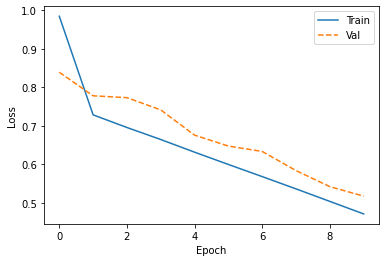

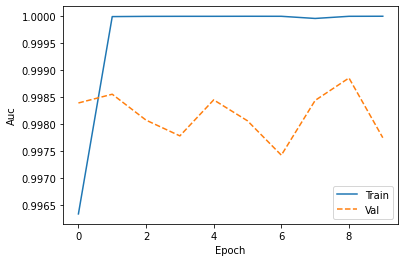

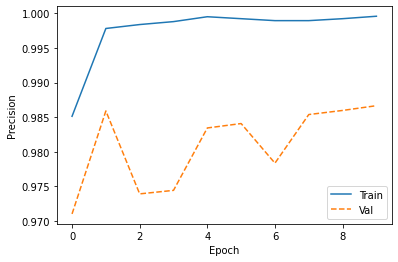

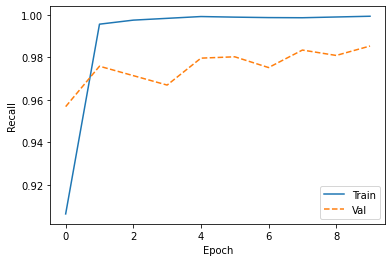

In [188]:
plot_metrics(hist)

In [187]:
results = model_l2.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 0.5167474746704102 
True Positive: 1723.0 
False Positive: 23.0 
True Negative: 13985.0 
False Negative: 28.0 
Accuracy: 0.9862935543060303 
Precision: 0.98682701587677 
Recall: 0.9840091466903687 
AUC: 0.998569905757904


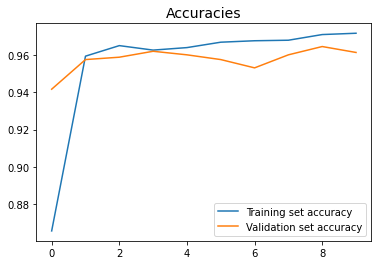

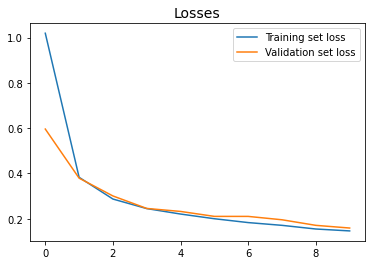

test loss: 0.1430007666349411 
test acc: 0.9708737730979919


In [53]:
# plot_acc(hist)
# plot_loss(hist)

# results = model_l2.evaluate(ds_test, verbose = 0)
# print('test loss:', results[0], '\ntest acc:', results[1])

Training set loss decreases smoothly with regularization and validation set loss follows the same trend.

### 4.1.2 Confusion matrix

In [133]:
# model_l2.compile(
#   optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE),
#   loss='sparse_categorical_crossentropy',
#   metrics=['sparse_categorical_accuracy']) 

# model_l2.load_weights('/content/gdrive/My Drive/checkpoints/l2_cp-0010.hdf5')

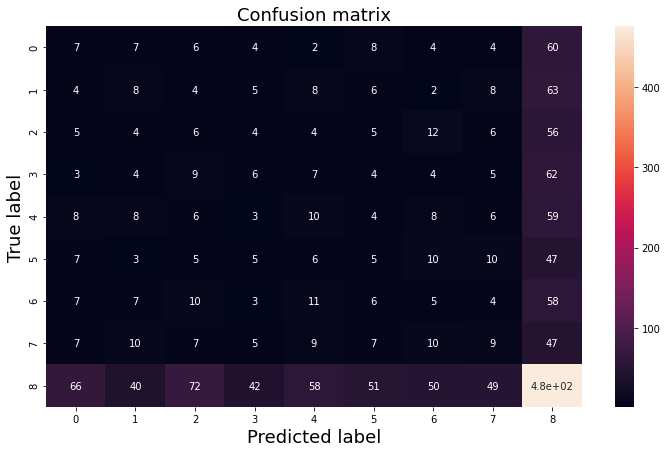

In [189]:
# predicted labels of the test data

predictions = model_l2.predict(ds_test)

preds = []
for i in range(len(predictions)):
   prediction = np.argmax(predictions[i])
   preds.append(prediction)

# The matrix columns represent the prediction labels and the rows represent the real labels

cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

### 4.1.3 Model comparison

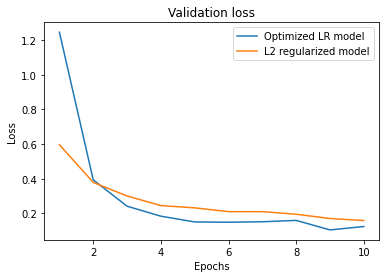

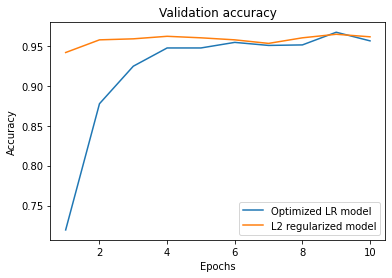

In [55]:
# l2_model_loss = np.copy(hist.history['val_loss'])
# l2_model_acc = np.copy(hist.history['val_sparse_categorical_accuracy'])

# plot_losses(opt_lr_model_loss, l2_model_loss, 'Optimized LR model', 'L2 regularized model')
# plot_accuracies(opt_lr_model_acc, l2_model_acc, 'Optimized LR model', 'L2 regularized model')

###KORJAA

In the beginning validation loss is higher for the L2 regularized model but it decreases rather smoothly. As the training proceeds, the val loss gap decreases between the models. For L2-regularized model the validation accuracy is rather high from the beginning and develops with less fumbling. 

Test accuracy is slightly smaller than with the optimized learning rate model. 

## 4.2 Dropout

Dropout is an ensemble model. This means that when we use a dropout layer, we train multiple different models and combine them to obtain one model.

The parameter value of dropout layer is the probability to mask a node in the next layer (multiply with 0 i.e. drop the node out). Dropout probability is a hyperparameter but I do not properly optimize it here. 

According to the Deep Learning -course slides dropout reduces the
effective capacity of the base model and to offset this, we must increase the size of the model. 

In [137]:
# To add the regularization I modify the layer structure at the decision part

# one hidden dense layer
dense=Dense(LAYER_SIZE, activation='relu')(pooling)

drop_out=Dropout(rate=0.3)(dense) # Dropout regularizer to avoid over fitting

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(drop_out) # by calling the output layer we end up calling all the other layers (the base model)

# the model
def create_model_drop():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out]
    )
  return model

model_drop=create_model_drop()
print(model_drop.summary())

# Note in the model summary the new dropout layer

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 129, 129, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 64, 64, 32)   864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 64, 64, 32)   128         Conv1[0][0]                      
____________________________________________________________________________________________

In [139]:
file_path="/content/gdrive/My Drive/checkpoints/dout_cp-{epoch:04d}.hdf5"

model_drop.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE),
  loss='sparse_categorical_crossentropy', 
  metrics=['sparse_categorical_accuracy']) 

hist = model_drop.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb])

Epoch 1/10
    443/Unknown - 42s 94ms/step - loss: 0.2468 - sparse_categorical_accuracy: 0.9261
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0001.hdf5
444/444 [==============================] - 60s 135ms/step - loss: 0.2467 - sparse_categorical_accuracy: 0.9261 - val_loss: 0.1008 - val_sparse_categorical_accuracy: 0.9759
Epoch 2/10
443/444 [============================>.] - ETA: 0s - loss: 0.1165 - sparse_categorical_accuracy: 0.9610
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0002.hdf5
444/444 [==============================] - 45s 101ms/step - loss: 0.1164 - sparse_categorical_accuracy: 0.9610 - val_loss: 0.0773 - val_sparse_categorical_accuracy: 0.9753
Epoch 3/10
443/444 [============================>.] - ETA: 0s - loss: 0.1016 - sparse_categorical_accuracy: 0.9664
Epoch 00003: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0003.hdf5
444/444 [==============================] - 44s 100ms/step - loss: 0.1015 - sparse_ca

### 4.2.1 Model accuracies and losses

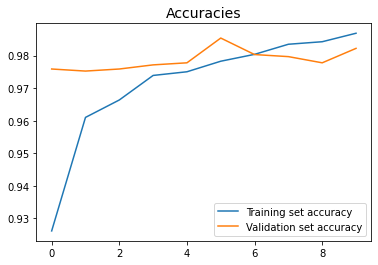

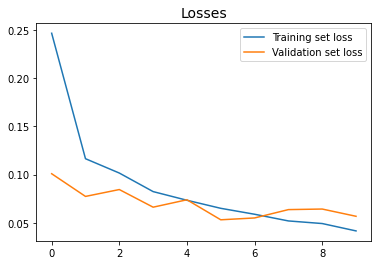

test loss: 0.06449010968208313 
test acc: 0.9811536073684692


In [142]:
plot_acc(hist)
plot_loss(hist)

results = model_drop.evaluate(ds_test, verbose = 0)
print('test loss:', results[0], '\ntest acc:', results[1])

### 4.2.2 Confusion matrix

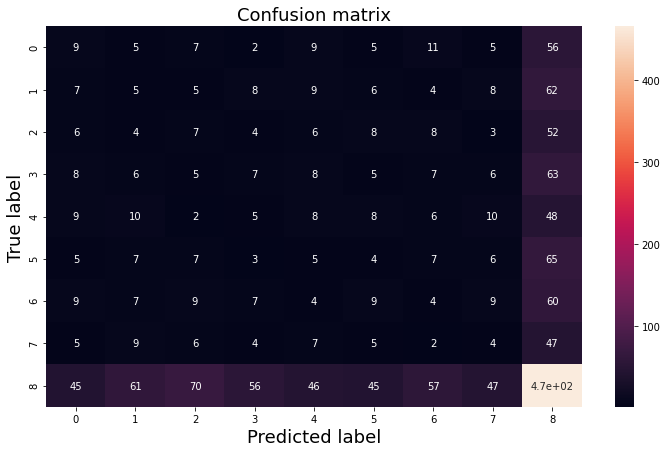

In [143]:
# predicted labels of the test data

predictions = model_drop.predict(ds_test)

preds = []
for i in range(len(predictions)):
   prediction = np.argmax(predictions[i])
   preds.append(prediction)

# The matrix columns represent the prediction labels and the rows represent the real labels

cf_mat = tf.math.confusion_matrix(
    labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

### 4.2.3 Model comparison

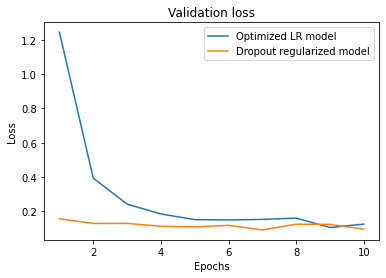

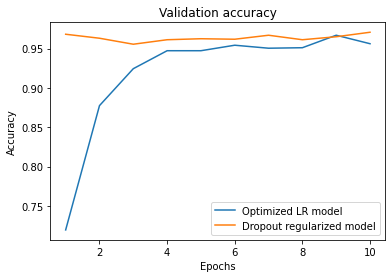

In [59]:
dropout_model_loss = np.copy(hist.history['val_loss'])
dropout_model_acc = np.copy(hist.history['val_sparse_categorical_accuracy'])

plot_losses(opt_lr_model_loss, dropout_model_loss, 'Optimized LR model', 'Dropout regularized model')
plot_accuracies(opt_lr_model_acc, dropout_model_acc, 'Optimized LR model', 'Dropout regularized model')

In the beginning validation loss is higher and validation accuracy lower for the optimized learning rate model but as the training proceeds the performance differences between the models decrease. Yet dropout model performs a little better in terms of validation and training accuracy. With 20 epochs the test accuracy is slightly better for it though. Using early stopping might change this.

Some experiments with the size of the dense layer and the dropout probability were maid. Indeed, scaling up the model compensated dropout and led to better test accuracy. If the model were built properly with these hyperparameters (dropout and layer size + learning rate) I should systematically optimize all of them instead of experimenting randomly.

## 4.3 Batch Normalization

During the data preprocessing I scaled the input values. Batch normalization scales the values of intermediate layers. 

According to Santurkar et al. batch normalization "-- makes the optimization landscape significantly smoother. This smoothness induces a more predictive and stable behavior of the gradients, allowing for faster training."(Santurkar, Tsipras, Ilyas & Madry, 2018, "How Does Batch Normalization Help Optimization?", URL: https://arxiv.org/abs/1805.11604)

For each batch passing trough the model batch normalization layer standardizes it before feeding it to the next layer. Batch normalization has two learnable hyperparameters, gamma = sqrt(var(x)) and beta = mean(x) (where x is the input. By adjusting these parameters we could deviate from the standardized normal distribution. In the code below I settle for using the default values.Normalization with default layer parameters makes the input follow standardized normal distribution. 

From the previous model summary calls can be seen that the base MobileNet model already utilizes multiple batch normalization layers. To include one more batch normalization to the model I add a stabilization layer, like I did with dropout. Batch normalization has largely replaced dropout in
modern convolutional architectures.

Since batch normalization makes optimization landscape smoother it allows for using larger learning rates. This makes the model converge faster and thus faster to train. 

In [26]:
# To add the regularization I modify the layer structure at the decision part

# one hidden dense layer
dense=Dense(LAYER_SIZE, activation='relu')(pooling)

bn=BatchNormalization()(dense) 

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(bn) # by calling the output layer we end up calling all the other layers (the base model)

# the model
def create_model_bn():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out]
    )
  return model

model_bn=create_model_bn()
print(model_bn.summary())

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 129, 129, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 64, 64, 32)   864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 64, 64, 32)   128         Conv1[0][0]                      
____________________________________________________________________________________________

In [146]:
file_path="/content/gdrive/My Drive/checkpoints/batchn_cp-{epoch:04d}.hdf5"

model_bn.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE),
  loss='sparse_categorical_crossentropy', 
  metrics=['sparse_categorical_accuracy']) 

hist = model_bn.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb]
    )

Epoch 1/10
    443/Unknown - 30s 68ms/step - loss: 0.2016 - sparse_categorical_accuracy: 0.9453
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0001.hdf5
444/444 [==============================] - 45s 102ms/step - loss: 0.2015 - sparse_categorical_accuracy: 0.9454 - val_loss: 0.0594 - val_sparse_categorical_accuracy: 0.9860
Epoch 2/10
443/444 [============================>.] - ETA: 0s - loss: 0.0696 - sparse_categorical_accuracy: 0.9804
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0002.hdf5
444/444 [==============================] - 45s 101ms/step - loss: 0.0696 - sparse_categorical_accuracy: 0.9804 - val_loss: 0.0831 - val_sparse_categorical_accuracy: 0.9784
Epoch 3/10
443/444 [============================>.] - ETA: 0s - loss: 0.0527 - sparse_categorical_accuracy: 0.9848
Epoch 00003: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0003.hdf5
444/444 [==============================] - 44s 99ms/step - loss: 0.0527 - sparse_cat

### 4.3.1 Model accuracies and losses

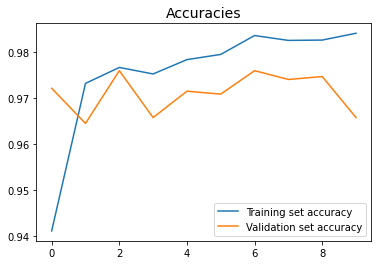

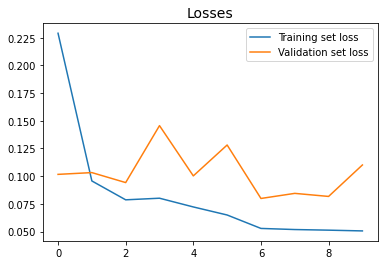

test loss: 0.0956287756562233 
test acc: 0.9691604971885681


In [62]:
plot_acc(hist)
plot_loss(hist)

results = model_bn.evaluate(ds_test, verbose = 0)
print('test loss:', results[0], '\ntest acc:', results[1])

The initial training loss is near 0.1 and decreases fast around 0.002. 

### 4.3.2 Confusion matrix

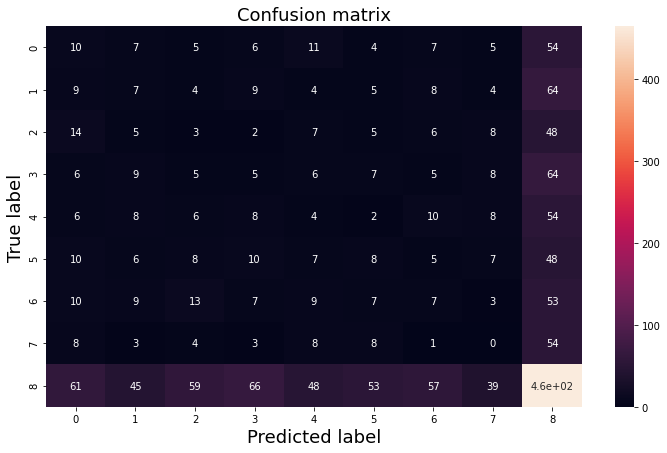

In [147]:
# predicted labels of the test data

predictions = model_bn.predict(ds_test)

preds = []
for i in range(len(predictions)):
   prediction = np.argmax(predictions[i])
   preds.append(prediction)

# The matrix columns represent the prediction labels and the rows represent the real labels

cf_mat = tf.math.confusion_matrix(
    labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

### 4.3.3 Model comparison

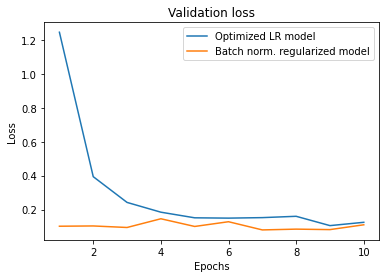

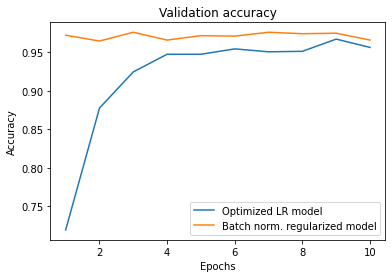

In [63]:
bn_model_loss = np.copy(hist.history['val_loss'])
bn_model_acc = np.copy(hist.history['val_sparse_categorical_accuracy'])

plot_losses(opt_lr_model_loss, bn_model_loss, 'Optimized LR model', 'Batch norm. regularized model')
plot_accuracies(opt_lr_model_acc, bn_model_acc, 'Optimized LR model', 'Batch norm. regularized model')

Adding one more batch normalization layer seems not to have a significant effect on the model performance. Test accuracy is almost the same as with the baseline model and the observed difference might be because of the random weight initialization.

Adding a batch normalization most certainly does not do harm for the model. When it comes to the other regularizers, the hyperparameters included (L2 coefficient, dropout rate, hidden layer size) should be optimized for the regularizers to do any good.

# 5. Building a learning rate scheduler and makeing it a callback in training (task 9)

Learning rate scheduler modulates how the learning rate of the optimizer changes over the training (https://keras.io/api/optimizers/). Since many of the Keras optimizers are adaptive, they do modify the learning rate by default as the training proceeds but it is also possible to build an own scheduler.

Until now I have used Adam optimizer, which has an adaptive learning rate. To observe the effect of the learning rate scheduler I change to SGD optimizer and set it's adaptive parameters (momentum and decay) to zero. The initial learning rate has to be selected by trial and error.

keras.optimizers.SGD(momentum=0.0, decay=0.0, nesterov=False)


In [64]:
# let's redefine the layer connections and create the baseline model again

# one hidden dense layer
dense=Dense(512, activation='relu')(pooling)

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(dense) # by calling the output layer we end up calling all the other layers (the base model)

model=create_model()
model.summary()

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 129, 129, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 64, 64, 32)   864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 64, 64, 32)   128         Conv1[0][0]                      
___________________________________________________________________________________________

In [65]:
# SGD
model.compile(
  optimizer=tf.keras.optimizers.SGD(momentum=0.0, decay=0.0, nesterov=False), # learning rate will be initialized below
  loss='sparse_categorical_crossentropy',
  metrics=['sparse_categorical_accuracy']) 

In [66]:
# custom scheduler, exponential decay 
# code from UTU Deep Learning course 

initial_lr = 0.001

def exp_decay(epoch, dummy_lr):
    k = 0.1 # decay rate, hyperparameter to adjust
    new_lr = initial_lr * math.exp(-k*epoch) # math.exp(x) returns e^x.
    print('LR = ', new_lr) 

    return new_lr

# callback
lrate = LearningRateScheduler(exp_decay)

In [67]:
hist = model.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[lrate])

LR =  0.001
Epoch 1/10
444/444 [==============================] - 69s 155ms/step - loss: 0.9832 - sparse_categorical_accuracy: 0.7208 - val_loss: 0.4457 - val_sparse_categorical_accuracy: 0.9448 - lr: 0.0010
LR =  0.0009048374180359595
Epoch 2/10
444/444 [==============================] - 68s 153ms/step - loss: 0.3716 - sparse_categorical_accuracy: 0.9563 - val_loss: 0.2390 - val_sparse_categorical_accuracy: 0.9664 - lr: 9.0484e-04
LR =  0.0008187307530779819
Epoch 3/10
444/444 [==============================] - 68s 153ms/step - loss: 0.2472 - sparse_categorical_accuracy: 0.9693 - val_loss: 0.1913 - val_sparse_categorical_accuracy: 0.9645 - lr: 8.1873e-04
LR =  0.0007408182206817179
Epoch 4/10
444/444 [==============================] - 68s 153ms/step - loss: 0.1933 - sparse_categorical_accuracy: 0.9733 - val_loss: 0.1508 - val_sparse_categorical_accuracy: 0.9721 - lr: 7.4082e-04
LR =  0.0006703200460356394
Epoch 5/10
444/444 [==============================] - 68s 154ms/step - loss: 0.1

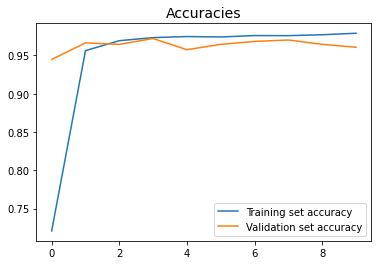

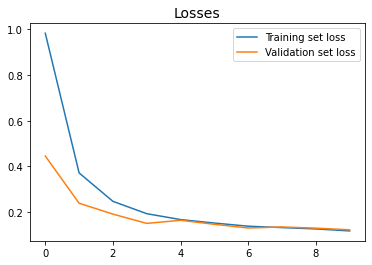

test loss: 0.12132590264081955 
test acc: 0.9674471616744995


In [68]:
plot_acc(hist)
plot_loss(hist)

results = model.evaluate(ds_test, verbose = 0)
print('test loss:', results[0], '\ntest acc:', results[1])

Training and validation losses align beautifully after ten epochs. I started with a high initial learning rate and setting it to a lower value might improve the performance. 

Losses kept on decreasing even when 20 epochs were run so adding more epochs could also help.

Compared to iterative and heavy learning rate optimization done in section 3.2 learning rate scheduler seems to find a smooth training path rather painlessly. Obviously more experimenting with the initial learning rate, updating schedule (every epoch or somthing else) and decay rate should be done.

In [69]:
lr_cb_model_loss = np.copy(hist.history['val_loss'])
lr_cb_model_acc = np.copy(hist.history['val_sparse_categorical_accuracy'])

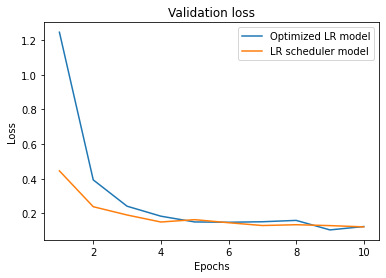

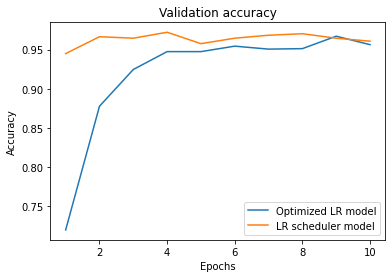

In [70]:
plot_losses(opt_lr_model_loss, lr_cb_model_loss, 'Optimized LR model',  'LR scheduler model')
plot_accuracies(opt_lr_model_acc, lr_cb_model_acc, 'Optimized LR model', 'LR scheduler model')

With a scheduled learning rate we did not reach as good results as with Adam but as stated abowe, the sceduler adapts fast and tuning it might outperform the baseline model.

# 7. Experimenting with TensorBoard (task 11)

[TensorBoard](https://www.tensorflow.org/tensorboard) is a tool for providing the measurements and visualizations needed during the machine learning workflow (https://www.tensorflow.org/tensorboard/get_started).

It is used as a callback for the model. For implementing the callback below i followed [Tensorflow tutorial](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard).

In [72]:
model=create_model()

model.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), # grid searched learning rate used here
  loss='sparse_categorical_crossentropy',
  metrics=['sparse_categorical_accuracy'])

# use the same directory as with model checkpoint callbacks
log_dir = cp_directory + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, 
                                                      histogram_freq=1)

model.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[tensorboard_callback])

Epoch 1/10
      2/Unknown - 1s 316ms/step - loss: 0.2058 - sparse_categorical_accuracy: 0.9688WARNING:tensorflow:Method (on_train_batch_end) is slow compared to the batch update (0.240632). Check your callbacks.


444/444 [==============================] - 88s 199ms/step - loss: 0.0745 - sparse_categorical_accuracy: 0.9841 - val_loss: 0.1133 - val_sparse_categorical_accuracy: 0.9657
Epoch 2/10
444/444 [==============================] - 88s 197ms/step - loss: 0.0471 - sparse_categorical_accuracy: 0.9853 - val_loss: 0.1218 - val_sparse_categorical_accuracy: 0.9581
Epoch 3/10
444/444 [==============================] - 88s 197ms/step - loss: 0.0397 - sparse_categorical_accuracy: 0.9873 - val_loss: 0.1192 - val_sparse_categorical_accuracy: 0.9651
Epoch 4/10
444/444 [==============================] - 88s 197ms/step - loss: 0.0422 - sparse_categorical_accuracy: 0.9871 - val_loss: 0.1361 - val_sparse_categorical_accuracy: 0.9619
Epoch 5/10
444/444 [==============================] - 87s 197ms/step - loss: 0.0360 - sparse_categorical_accuracy: 0.9891 - val_loss: 0.0791 - val_sparse_categorical_accuracy: 0.9740
Epoch 6/10
444/444 [==============================] - 88s 198ms/step - loss: 0.0321 - sparse_cat

In [73]:
# launch tensorboard in Colab
%tensorboard --logdir "/content/gdrive/My Drive/checkpoints/"

<IPython.core.display.Javascript object>

The ability to inspect and tune [link text](https://)[hyperparameters with Tensor Board](https://www.tensorflow.org/tensorboard/hyperparameter_tuning_with_hparams) as well as [plot custom learning rates](https://www.tensorflow.org/tensorboard/scalars_and_keras) would be something interesting to do.

# 8. Afterthought. What would I do differently next time? (task 12)

For all of the models in this task each missclassification has the same value. Since the labels are unbalanced, it would be wiser to do cost sensitive modeling. In this case we would add a heavier penalty for missclassifying a case belonging to a smaller class (all the classes but 8) and take this penalization cost into account when minimizing the total loss of the model.

Input size was selected on basis of the computational capacity instead of model performance. This limitation has to be accepted with the Colab resources available since larger input size led to crashing runtimes.

In section 5 To truly find optimal learning rate more learning rate schedulers should be experimented.

When using a ready built model the model architecture seems to dictate how well the classifier performs. MobileNet was chosen for fast performance when the goal was to experiment many regularizers and repeat the training. It might be interesting to try Efficientnet, Inception or ResNet models.

If I were to repeat the task now I would do more careful data augmentation with random noise to add model robustness. This might improve the test results.

Most of the hyperparameters (batch size, hidden layer size, input shape etc.)were selected separatedy. This is not good practice since they truly cooperate in the model. Setting a proper hyperparameter grid or working with TensorBoard would help adjusting the hyperparameters simultaneously. This however is again computationally expensive procedure.

I would also use multiple callbacks: learning rate sceduler, model checkpoints, TensorBoard and Early stopping. More epochs combined with Early stopping would be beneficial since in the most promising cases the training loss kept decreasing even after 20 epochs.



# Extra

In [44]:
# To add the regularization I modify the layer structure at the decision part

# one hidden dense layer
dense=Dense(LAYER_SIZE, activation='relu')(pooling)

bn=BatchNormalization()(dense) 

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(bn) # by calling the output layer we end up calling all the other layers (the base model)

# the model
def create_model_bn():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out]
    )
  return model

In [45]:
METRICS = [
      tf.keras.metrics.TruePositives(name='tp'),
      tf.keras.metrics.FalsePositives(name='fp'),
      tf.keras.metrics.TrueNegatives(name='tn'),
      tf.keras.metrics.FalseNegatives(name='fn'), 
      tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc')
]


model_bn=create_model_bn()
#model.compile('sgd', loss='mse', metrics=[tf.keras.metrics.AUC()])

file_path="/content/gdrive/My Drive/checkpoints/batchn_AUC_cp-{epoch:04d}.hdf5"

model_bn.compile(
  optimizer=tf.keras.optimizers.Adam(lr=0.0001), # LEARNING_RATE
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  #metrics=['sparse_categorical_accuracy'],
  metrics=METRICS)

hist = model_bn.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val
    )


 57/111 [==============>...............] - ETA: 18s - loss: 0.1757 - tp: 6797.0000 - fp: 338.0000 - tn: 58030.0000 - fn: 499.0000 - accuracy: 0.9413 - precision: 0.9526 - recall: 0.9316 - auc: 0.9976

KeyboardInterrupt: ignored